# Competitive Data Role Predictor

**Name(s)**: Ethan Arnn

**Website Link**: [https://earnn04.github.io/Competitive-Data-Role-Predictor](https://earnn04.github.io/Competitive-Data-Role-Predictor/)

In [5]:
import pandas as pd
import numpy as np
from pathlib import Path

import plotly.express as px
pd.options.plotting.backend = 'plotly'

from dsc80_utils import *

## Step 1: Introduction

Currently I want to explore making predictions on what role a player played given their post-game data. 

In [6]:
lol_fp = Path('data') / '2022_LoL_data.csv'
lol = pd.read_csv(lol_fp)
lol

/var/folders/9k/jmm192cd4qgfwgw8kn2fwkfm0000gn/T/ipykernel_82939/3089127226.py:2: DtypeWarning:

Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.



,gameid,datacompleteness,url,league,...,deathsat25,opp_killsat25,opp_assistsat25,opp_deathsat25
0,ESPORTSTMNT01_2690210,complete,NaN,LCKC,...,1.0,0.0,2.0,0.0
1,ESPORTSTMNT01_2690210,complete,NaN,LCKC,...,2.0,1.0,5.0,1.0
2,ESPORTSTMNT01_2690210,complete,NaN,LCKC,...,0.0,3.0,4.0,3.0
...,...,...,...,...,...,...,...,...,...
150585,9687-9687_game_5,partial,https://lpl.qq.com/es/stats.shtml?bmid=9687,DCup,...,NaN,NaN,NaN,NaN
150586,9687-9687_game_5,partial,https://lpl.qq.com/es/stats.shtml?bmid=9687,DCup,...,NaN,NaN,NaN,NaN
150587,9687-9687_game_5,partial,https://lpl.qq.com/es/stats.shtml?bmid=9687,DCup,...,NaN,NaN,NaN,NaN


## Step 2: Data Cleaning and Exploratory Data Analysis

Firstly, since my question concerns predicting what role a player played based on their post-game states, I want to remove the rows containing summary data for the teams.

In [13]:
lol_individual = lol[lol['position'] != 'team']
lol_individual.shape

(125490, 164)

In some of our critical columns, we have a trivial number of missing values. Since this will impede in building our model and the amount of missing data is so small, we will remove these columnds.

In [14]:
lol_individual[['damageshare', 'earned gpm', 'damagetakenperminute']].isna().sum()

damageshare             10
earned gpm              10
damagetakenperminute    10
dtype: int64

In [16]:
lol_clean = lol_individual.dropna(subset=['damageshare', 'earned gpm', 'damagetakenperminute'])
lol_clean.head()

,gameid,datacompleteness,url,league,...,deathsat25,opp_killsat25,opp_assistsat25,opp_deathsat25
0,ESPORTSTMNT01_2690210,complete,NaN,LCKC,...,1.0,0.0,2.0,0.0
1,ESPORTSTMNT01_2690210,complete,NaN,LCKC,...,2.0,1.0,5.0,1.0
2,ESPORTSTMNT01_2690210,complete,NaN,LCKC,...,0.0,3.0,4.0,3.0
3,ESPORTSTMNT01_2690210,complete,NaN,LCKC,...,2.0,3.0,4.0,0.0
4,ESPORTSTMNT01_2690210,complete,NaN,LCKC,...,2.0,0.0,7.0,2.0


In [10]:
lol_clean.shape

(125470, 164)

In [22]:
print(lol_clean[['gameid', 'position',
                  'champion', 'earned gpm',
                    'damageshare', 'monsterkills',
                    'wpm','result']].head().to_markdown(index=False))

| gameid                | position   | champion   |   earned gpm |   damageshare |   monsterkills |    wpm |   result |
|:----------------------|:-----------|:-----------|-------------:|--------------:|---------------:|-------:|---------:|
| ESPORTSTMNT01_2690210 | top        | Renekton   |      250.928 |     0.278784  |             11 | 0.2802 |        0 |
| ESPORTSTMNT01_2690210 | jng        | Xin Zhao   |      188.021 |     0.208009  |            115 | 0.2102 |        0 |
| ESPORTSTMNT01_2690210 | mid        | LeBlanc    |      208.231 |     0.252086  |             16 | 0.6655 |        0 |
| ESPORTSTMNT01_2690210 | bot        | Samira     |      239.405 |     0.196358  |             18 | 0.4203 |        0 |
| ESPORTSTMNT01_2690210 | sup        | Leona      |      101.856 |     0.0647631 |              0 | 1.0158 |        0 |


#### **Univariate Analysis**

In [19]:
fig_gold = px.histogram(
    lol_clean, 
    x='earned gpm', 
    nbins=50, 
    title='Distribution of Earned Gold Per Minute (All Roles)',
    labels={'earned gpm': 'Gold Per Minute'},
)

fig_gold.show()

fig_gold.write_html('univariate_plot.html', include_plotlyjs='cdn')

In [ ]:
fig_league = px.histogram(
    lol_clean, 
    x='league', 
    title='Number of Observations per League',
    labels={'league': 'League Name'},
)

fig_league.update_xaxes(categoryorder='total descending')
fig_league.show()

#### **Bivariate Analysis:**

In [ ]:
wards_plot = px.box(lol_clean, x='position', y='wpm')
wards_plot.show()
#support players have significantly higher wards per minute

In [ ]:
dmg_taken_plot = px.box(lol_clean, x='position', y='damagetakenperminute')
dmg_taken_plot.show()
#jungle has a significantly higher damage taken, with top and mid follwing behind

In [ ]:
dmg_mitigated_plot = px.box(lol_clean, x='position', y='earned gpm')
dmg_mitigated_plot.show()
# bottom lane tends to have the highest damage mitigated, however there isn't
# much distinction between that and the other lanes.

In [23]:
monster_kills_plot = px.box(lol_clean, x='position', y='monsterkills')
monster_kills_plot.show()
#jungle players have a vastly higher amount of monster kills

monster_kills_plot.write_html('bivariate_plot.html', include_plotlyjs='cdn')

From the data visualization, it's easy to see that there are traits that very quickly determine whether a player is a jungler or a support player (monster kills, wards per minute). These features would be useful in our machine learning model to make those distinctions– however the main challenge will be distinguishing top, mid, and bot lane players from one another as their stats are relatively similar across all categories.

In [ ]:
pivot_agg = lol_clean.pivot_table(
    index='position', 
    values=['earned gpm', 'monsterkills', 'wpm', 'damagetotowers', 'assists'],
    aggfunc='mean'
).sort_values('earned gpm', ascending=False)

pivot_agg

,assists,damagetotowers,earned gpm,monsterkills,wpm
position,,,,,
bot,5.37,5247.85,299.92,22.55,0.43
mid,5.89,2761.66,267.47,17.10,0.41
top,5.02,4105.14,257.90,15.13,0.38
jng,6.86,1483.36,212.39,143.22,0.36
sup,9.19,539.65,110.59,0.44,1.45


In [26]:
print(pivot_agg.to_markdown(index=True))

| position   |   assists |   damagetotowers |   earned gpm |   monsterkills |      wpm |
|:-----------|----------:|-----------------:|-------------:|---------------:|---------:|
| bot        |   5.37467 |         5247.85  |      299.917 |      22.5505   | 0.431304 |
| mid        |   5.89495 |         2761.66  |      267.468 |      17.102    | 0.413005 |
| top        |   5.02403 |         4105.14  |      257.898 |      15.1288   | 0.38049  |
| jng        |   6.85714 |         1483.36  |      212.393 |     143.216    | 0.357516 |
| sup        |   9.19001 |          539.651 |      110.589 |       0.440145 | 1.45195  |


## Step 3: Assessment of Missingness

I believe the missingness in columnds `ban1`, `ban2`, `ban3`, `ban4`, and `ban5` are examples of NMAR. These values are likely missing because either the players didn't choose to ban anyone, or they ran out of time to ban a champion. If we added options for "skipped" or "none", we would explicitly know why a champion wasn't picked for the ban. Then these columns would have MAR missingness. 

In [ ]:
lol_clean['teamid'].isna().sum()

#our dataset has 1,785 missing team id's

np.int64(1785)

The `teamid` column in our dataset has a significant amount of missing data. Below we will run a permutation test to determine whether the missingness of this column depends on the `result` column (win/loss)

- **Null Hypothesis:** The missingness of `teamid` is independent of `result`
- **Alternative Hypothesis:** The missingness of `teamid` depends on `result`

In [ ]:
missing_col = 'teamid'
lol_clean['is_missing'] = lol_clean[missing_col].isna()

check_col = 'result'

dist = lol_clean.groupby('is_missing')[check_col].mean()
obs_diff = dist.loc[True] - dist.loc[False]

n_repetitions = 500
differences = []

for _ in range(n_repetitions):
    shuffled = np.random.permutation(lol_clean[check_col])
    lol_clean['shuffled_missing'] = shuffled

    group_means = lol_clean.groupby('is_missing')['shuffled_missing'].mean()

    differences.append(group_means.loc[True] - group_means.loc[False])

p_value = (differences <= obs_diff).mean()
p_value

fig = px.histogram(
    differences,
    nbins=30, 
    title='Empirical Distribution vs. Observed Statistic',
    labels={'diff': 'Difference in Win Rate (Absolute)'},
)
fig.add_vline(x=obs_diff, line_color='red', line_width=3, layer='above')
fig.update_xaxes(range=[-0.06, 0.05])
fig.update_layout(
    xaxis_title="Difference in Means (Randomized)",
    yaxis_title="Count",
    showlegend=False
)

fig.show()

After running 500 simulations we ended up with a p-value of zero. This means we reject the null hypothesis and conclude that the missingness of `teamid` is dependent on `result`. Specifically, losing teams are more likely to have missing IDs than winning teams. This suggests this column is **Missing At Random (MAR)**

We will also run a permutation test to determine whether the missingness of `teamid` depends on `position`.
- **Null Hypothesis:** The missingness of `teamid` is independent of `position`
- **Alternative Hypothesis:** The missingness of `teamid` depends on `position`

In [ ]:
missing_col = 'teamid'
check_col = 'position'

lol_clean['is_missing'] = lol_clean[missing_col].isna()

def calculate_tvd(df, group_col, cat_col):
    dist = (
        df.groupby(group_col)[cat_col]
        .value_counts(normalize=True)
        .rename('proportion')
        .reset_index()
    )
    pivot = dist.pivot(index=cat_col, columns=group_col, values='proportion').fillna(0)
    tvd = 0.5 * (abs(pivot[True] - pivot[False])).sum()
    return tvd

obs_tvd = calculate_tvd(lol_clean, 'is_missing', check_col)

n_repetitions = 500
tvds = []

for _ in range(n_repetitions):
    shuffled = np.random.permutation(lol_clean[check_col])

    lol_clean['shuffled_missing'] = shuffled

    tvd = calculate_tvd(lol_clean, 'is_missing', 'shuffled_missing')
    tvds.append(tvd)

p_value = (tvds >= obs_tvd).mean()
p_value

fig = px.histogram(
    pd.DataFrame({'tvd': tvds}), 
    x='tvd', 
    nbins=30, 
    title='Empirical Distribution vs. Observed Statistic',
    labels={'diff': 'Difference in Win Rate (Absolute)'},
)
fig.add_vline(x=obs_tvd, line_color='red', line_width=3, layer='above')
fig.update_xaxes(range=[0, 0.05])
fig.update_layout(
    xaxis_title="Difference in Means (Randomized)",
    yaxis_title="Count",
    showlegend=False
)

fig.show()

After running 500 simulations we ended up with a p-value of 1.0. Since 1.0 > 0.05 (and since it's the highest possible p-value we can achieve) we can confidently say that the `position` of a player has nothing to do with the missingness of their `teamid`. When a `teamid` is missing for one player, it's likely missing for every person on that team. That means we have an equal amount of values for each player and our observed TVD is 0. Due to random variation, every permutation has a slightly different number of missing values for each position, meaning the simulated TVD is slightly more than 0. We can confidently say `teamid` is **MCAR (Missing Completely At Random)** with respect to `position`.

## Step 4: Hypothesis Testing

Null hypothesis: There is no difference between the average damageshare of top lane players and the average damageshare of midlane players

Alternative hypothesis: The average damageshare of midlane players is larger than the average damageshare of top lane players

In [ ]:
# I want to test whether the damageshare for top and midlane characters is the same or not.
# That way I can determine if this is a good feature to use in a model
# for classifying positions.

top_dmgshare_avg = lol_clean[lol_clean['position'] == 'top']['damageshare'].mean()
print(top_dmgshare_avg)

mid_dmgshare_avg = lol_clean[lol_clean['position'] == 'mid']['damageshare'].mean()
print(mid_dmgshare_avg)

observed_diff = top_dmgshare_avg - mid_dmgshare_avg
observed_diff


0.2352230817022633
0.2609270147513549


np.float64(-0.025703933049091576)

Now we will perform a permutation test by shuffling the top and midlane labels and calculating the various damageshare averages

In [ ]:
lol_top_mid = lol_clean[(lol_clean['position'] == 'top')
                              | (lol_clean['position'] == 'mid')]

differences = []
n = 1000

for _ in range(n):

    shuffled_positions = np.random.permutation(lol_top_mid['position'])
    lol_top_mid['shuffled_positions'] = shuffled_positions

    top_perm_avg = lol_top_mid[lol_top_mid['shuffled_positions'] == 'top']['damageshare'].mean()
    mid_perm_avg = lol_top_mid[lol_top_mid['shuffled_positions'] == 'mid']['damageshare'].mean()

    differences.append(top_perm_avg - mid_perm_avg)

p_value = sum([diff <= observed_diff for diff in differences]) / n
p_value

np.float64(0.0)

Our p_value is 0 which is statistically significant at the 0.05 level. This means that damageshare could be a useful to predicting whether a player is top or mid.

## Step 5: Framing a Prediction Problem

##### For the prediction problem, I will be prediction what role someone played in a League of Legends match given their end-game stats. This will be a multi-class classification problem. I plan on using a Random Forest model, and using F1-score to evaluate my model.

## Step 6: Baseline Model

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

In [ ]:
X = lol_clean[['cspm', 'champion', 'damageshare']]
y = lol_clean['position']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [14]:
preprocessor = ColumnTransformer(
    transformers=[
        ('ohc', OneHotEncoder(drop='first'), ['champion']),
        ('ss', StandardScaler(), ['cspm', 'damageshare'])
    ],
)

In [15]:
pl = Pipeline([
    ('preprocessor', preprocessor),
    ('rfc', RandomForestClassifier(max_depth=20, n_estimators=100, random_state=42))
])

In [16]:
pl.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ohc',
                                                  OneHotEncoder(drop='first'),
                                                  ['champion']),
                                                 ('ss', StandardScaler(),
                                                  ['cspm', 'damageshare'])])),
                ('rfc', RandomForestClassifier(max_depth=20, random_state=42))])

In [17]:
pl.score(X_train, y_train)

0.9066199128679205

In [18]:
pl.score(X_test, y_test)

0.8986292636276697

## Step 7: Final Model

In [16]:
from sklearn.preprocessing import QuantileTransformer

In [ ]:
X = lol_clean[['cspm', 'damageshare', 'damagetakenperminute', 'earned gpm', 'champion']]
y = lol_clean['position']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

We add damagetakenperminute because we saw it to be distinctive during EDA, we apply standard scalar to it

We also add earnedgpm because of its EDA and add QuantileTransformer to a normal distribution because the data tends to be skewed for earned gold.

In [22]:
preprocessor = ColumnTransformer(
    transformers=[
        ('ohc', OneHotEncoder(handle_unknown='ignore'), ['champion']),
        ('ss', StandardScaler(), ['cspm', 'damageshare']),
        ('quant_gold', QuantileTransformer(output_distribution='normal'), ['earned gpm']),
        ('new ss', StandardScaler(), ['damagetakenperminute'])
    ]
)

In [23]:
pl = Pipeline([
    ('preprocessor', preprocessor),
    ('rfc', RandomForestClassifier(max_depth=20, n_estimators=100, random_state=42))
])

In [19]:
from sklearn.model_selection import GridSearchCV

hyperparameters = {
    'rfc__max_depth': [10, 20, None], 
    'rfc__n_estimators': [50, 100, 200] 
}

grids = GridSearchCV(
    pl,
    n_jobs=-1,
    param_grid=hyperparameters,
    return_train_score=True,
    error_score='raise'
)

grids.fit(X_train, y_train)

GridSearchCV(error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('ss',
                                                                         StandardScaler(),
                                                                         ['cspm',
                                                                          'damageshare',
                                                                          'damagetakenperminute',
                                                                          'earned '
                                                                          'gpm',
                                                                          'monsterkills',
                                                                          'damagetotowers',
                                                                          'assists']),
                                                                        ('quant_gold',
                                                                         QuantileTransformer(output_distribution='normal'),
                                                                         ['earned '
                                                                          'gpm']),
                                                                        ('new '
                                                                         'ss',
                                                                         StandardScaler(),
                                                                         ['damagetakenperminute'])])),
                                       ('rfc',
                                        RandomForestClassifier(max_depth=20,
                                                               random_state=42))]),
             n_jobs=-1,
             param_grid={'rfc__max_depth': [10, 20, None],
                         'rfc__n_estimators': [50, 100, 200]},
             return_train_score=True)

In [25]:
grids.best_params_

{'rfc__max_depth': None, 'rfc__n_estimators': 100}

In [26]:
grids.score(X_train, y_train)

0.9999787464666001

In [27]:
grids.score(X_test, y_test)

0.9564524356031625

We were able to build the accuracy of our random forest model up to 95% on the training data. However, this number was suspiciously high. I suspect that the reason is because of the "champion" column. Since most champions in League of Legends are primarly played in one specific role, this feature may be giving away the answer.

In [28]:
X = lol_clean[['cspm', 'damageshare', 'damagetakenperminute', 'earned gpm']]
y = lol_clean['position']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

preprocessor = ColumnTransformer(
    transformers=[
        ('ss', StandardScaler(), ['cspm', 'damageshare']),
        ('quant_gold', QuantileTransformer(output_distribution='normal'), ['earned gpm']),
        ('new ss', StandardScaler(), ['damagetakenperminute'])
    ]
)

pl = Pipeline([
    ('preprocessor', preprocessor),
    ('rfc', RandomForestClassifier(max_depth=20, n_estimators=100, random_state=42))
])

hyperparameters = {
    'rfc__max_depth': [10, 20, None], 
    'rfc__n_estimators': [50, 100, 200] 
}

grids = GridSearchCV(
    pl,
    n_jobs=-1,
    param_grid=hyperparameters,
    return_train_score=True,
    error_score='raise'
)

grids.fit(X_train, y_train)

GridSearchCV(error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('ss',
                                                                         StandardScaler(),
                                                                         ['cspm',
                                                                          'damageshare']),
                                                                        ('quant_gold',
                                                                         QuantileTransformer(output_distribution='normal'),
                                                                         ['earned '
                                                                          'gpm']),
                                                                        ('new '
                                                                         'ss',
                                                                         StandardScaler(),
                                                                         ['damagetakenperminute'])])),
                                       ('rfc',
                                        RandomForestClassifier(max_depth=20,
                                                               random_state=42))]),
             n_jobs=-1,
             param_grid={'rfc__max_depth': [10, 20, None],
                         'rfc__n_estimators': [50, 100, 200]},
             return_train_score=True)

In [29]:
grids.best_params_

{'rfc__max_depth': 10, 'rfc__n_estimators': 100}

In [30]:
grids.score(X_train, y_train)

0.7272108988119275

In [31]:
grids.score(X_test, y_test)

0.7161757204794695

Removing the champion column rediced the training and test scores down to around 72%. Using champions to predict what role isn't an intersting question because a vast majority of the time, champions are only used in a specific role. So I am changing the aim of the project to predicting roles solely based on how the game was played. The below graph shows us that our model is excellent at predicting Jungle and Support positions, however it's very inaccurate when it comes to mid-lane predictions, and is decent at bottom and top-lane predictions.

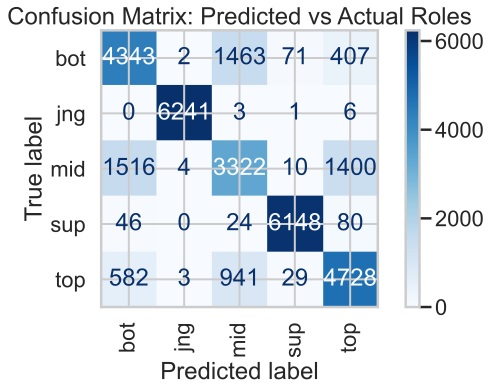

              precision    recall  f1-score   support

         bot       0.67      0.69      0.68      6286
         jng       1.00      1.00      1.00      6251
         mid       0.58      0.53      0.55      6252
         sup       0.98      0.98      0.98      6298
         top       0.71      0.75      0.73      6283

    accuracy                           0.79     31370
   macro avg       0.79      0.79      0.79     31370
weighted avg       0.79      0.79      0.79     31370



In [42]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(
    grids, 
    X_test, 
    y_test, 
    cmap='Blues',
    xticks_rotation='vertical'
)
plt.title("Confusion Matrix: Predicted vs Actual Roles")
plt.show()

print(classification_report(y_test, grids.predict(X_test)))

The mid-lane predictions are likely weak because there have been very few mid-lane specific features included. Mid Laner, Bot, and Top roles look exactly the same to the model: High CS, high gold, and high damage. After some research, I will include the following features:

- `monsterkills` is a trait reserved for jungle players. They will likely have 100+ monster kills while top/mid/bottom laners will have <20

- `damagetotowers` is a feature that will help distinguish between top and mid-laners. Bottom laners will consistently have more damage to towers. This will help the model realize that when a player has high gold and high damagetotowers, it will likely be bot, meanwhile high gold and low damagetotowers will likely be mid-lane.

- `assists` the assists feature will be helpful in distinguishing between top and mid-lane players. In the start of a typical match, top-lane players are typically isolated engaging in 1v1 fights. Meanwhile the mid-lane player typically roams to help other players. This leads to mid-lane players having higher assists than top.

In [ ]:
X = lol_clean[['cspm', 'damageshare', 'damagetakenperminute', 'earned gpm', 
               'monsterkills', 'damagetotowers', 'assists']]
y = lol_clean['position']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

preprocessor = ColumnTransformer(
    transformers=[
        ('ss', StandardScaler(), ['cspm', 'damageshare', 'damagetakenperminute',
                                   'earned gpm', 'monsterkills',
                                     'damagetotowers', 'assists']),
        ('quant_gold', QuantileTransformer(output_distribution='normal'),
          ['earned gpm']),
        ('new ss', StandardScaler(), ['damagetakenperminute'])
    ]
)

pl = Pipeline([
    ('preprocessor', preprocessor),
    ('rfc', RandomForestClassifier(max_depth=20, n_estimators=100, random_state=42))
])

hyperparameters = {
    'rfc__max_depth': [10, 20, None], 
    'rfc__n_estimators': [50, 100, 200] 
}

grids = GridSearchCV(
    pl,
    n_jobs=-1,
    param_grid=hyperparameters,
    return_train_score=True,
    error_score='raise'
)

grids.fit(X_train, y_train)

GridSearchCV(error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('ss',
                                                                         StandardScaler(),
                                                                         ['cspm',
                                                                          'damageshare',
                                                                          'damagetakenperminute',
                                                                          'earned '
                                                                          'gpm',
                                                                          'monsterkills',
                                                                          'damagetotowers',
                                                                          'assists']),
                                                                        ('quant_gold',
                                                                         QuantileTransformer(output_distribution='normal'),
                                                                         ['earned '
                                                                          'gpm']),
                                                                        ('new '
                                                                         'ss',
                                                                         StandardScaler(),
                                                                         ['damagetakenperminute'])])),
                                       ('rfc',
                                        RandomForestClassifier(max_depth=20,
                                                               random_state=42))]),
             n_jobs=-1,
             param_grid={'rfc__max_depth': [10, 20, None],
                         'rfc__n_estimators': [50, 100, 200]},
             return_train_score=True)

In [34]:
grids.best_params_

{'rfc__max_depth': 20, 'rfc__n_estimators': 200}

In [35]:
grids.score(X_train, y_train)

0.9712439693098978

In [36]:
grids.score(X_test, y_test)

0.789339454220862

This new model seems to be severely overfit to our data. To try and broaden our results, we will generalize by providing more shallow options for the `max_depth`. We will also add a hyperparameter `min_samples_leaf` which makes it so that a rule is only valid if it applies to a certain amount of examples in our dataset. These changes in our construction of the random forest classifier should lower our training score and raise our test score.

In [ ]:
X = lol_clean[['cspm', 'damageshare', 'damagetakenperminute', 'earned gpm', 
               'monsterkills', 'damagetotowers', 'assists']]
y = lol_clean['position']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

preprocessor = ColumnTransformer(
    transformers=[
        ('ss', StandardScaler(), ['cspm', 'damageshare', 'damagetakenperminute',
                                   'earned gpm', 'monsterkills',
                                     'damagetotowers', 'assists']),
        ('quant_gold', QuantileTransformer(output_distribution='normal'),
          ['earned gpm']),
        ('new ss', StandardScaler(), ['damagetakenperminute'])
    ]
)

pl = Pipeline([
    ('preprocessor', preprocessor),
    ('rfc', RandomForestClassifier(max_depth=20, n_estimators=100, random_state=42))
])

hyperparameters = {
    'rfc__max_depth': [5, 8, 10, 15, 20],
    'rfc__min_samples_leaf': [5, 10, 20, 50],
    'rfc__n_estimators': [50, 100, 200] 
}

grids = GridSearchCV(
    pl,
    n_jobs=-1,
    param_grid=hyperparameters,
    return_train_score=True,
    error_score='raise'
)

grids.fit(X_train, y_train)

GridSearchCV(error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('ss',
                                                                         StandardScaler(),
                                                                         ['cspm',
                                                                          'damageshare',
                                                                          'damagetakenperminute',
                                                                          'earned '
                                                                          'gpm',
                                                                          'monsterkills',
                                                                          'damagetotowers',
                                                                          'assists']),
                                                                        ('quant_gold',
                                                                         QuantileTransformer(output_distribution='normal'),
                                                                         ['earned '
                                                                          'gpm']),
                                                                        ('new '
                                                                         'ss',
                                                                         StandardScaler(),
                                                                         ['damagetakenperminute'])])),
                                       ('rfc',
                                        RandomForestClassifier(max_depth=20,
                                                               random_state=42))]),
             n_jobs=-1,
             param_grid={'rfc__max_depth': [5, 8, 10, 15, 20],
                         'rfc__min_samples_leaf': [5, 10, 20, 50],
                         'rfc__n_estimators': [50, 100, 200]},
             return_train_score=True)

In [38]:
grids.best_params_

{'rfc__max_depth': 15, 'rfc__min_samples_leaf': 10, 'rfc__n_estimators': 100}

In [39]:
grids.score(X_train, y_train)

0.8287602813967823

In [40]:
grids.score(X_test, y_test)

0.7885424636572304

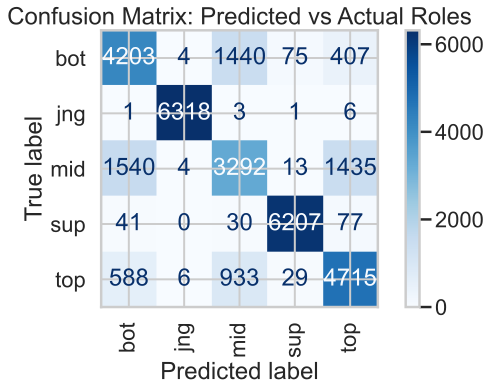

In [41]:
ConfusionMatrixDisplay.from_estimator(
    grids, 
    X_test, 
    y_test, 
    cmap='Blues',
    xticks_rotation='vertical'
)
plt.title("Confusion Matrix: Predicted vs Actual Roles")
plt.show()

In [42]:
print(classification_report(y_test, grids.predict(X_test)))

              precision    recall  f1-score   support

         bot       0.66      0.69      0.67      6129
         jng       1.00      1.00      1.00      6329
         mid       0.58      0.52      0.55      6284
         sup       0.98      0.98      0.98      6355
         top       0.71      0.75      0.73      6271

    accuracy                           0.79     31368
   macro avg       0.79      0.79      0.79     31368
weighted avg       0.79      0.79      0.79     31368



## Step 8: Fairness Analysis

For my fairness analysis I want to test whether my model works better for those who won their respective matches or those who lost. Since my model relies on features such as gold, kills, and towers– my numbers may be deflated for those who lost their matches. 
- **Null Hypothesis:** Our model is fair: the accuracy for players on the winning team is roughly the same as it is for players on the losing team.
- **Alternative Hypothesis:** Our model is unfair: the accuracy for players on the losing team is significantly less than it is for players on the winning team.

In [27]:
X_test_fair = X_test.copy()
X_test_fair['result'] = lol_clean.loc[X_test_fair.index, 'result']
X_test_fair['preds'] = grids.predict(X_test)
X_test_fair['truth'] = y_test
X_test_fair

,cspm,damageshare,damagetakenperminute,earned gpm,...,assists,result,preds,truth
3471,7.46,0.23,592.06,298.94,...,9,1,mid,bot
80103,9.93,0.28,270.35,385.04,...,5,1,bot,bot
81388,1.27,0.06,284.83,107.03,...,15,1,sup,sup
...,...,...,...,...,...,...,...,...,...
65922,4.92,0.15,979.21,151.81,...,4,0,jng,jng
34833,1.35,0.07,398.02,113.65,...,15,1,sup,sup
73371,7.92,0.29,330.11,341.72,...,7,1,bot,bot


In [41]:
from sklearn.metrics import accuracy_score

winner_accuracy = accuracy_score(X_test_fair[X_test_fair['result'] == 1]['truth'],
                                 X_test_fair[X_test_fair['result'] == 1]['preds'])

loser_accuracy = accuracy_score(X_test_fair[X_test_fair['result'] == 0]['truth'],
                                 X_test_fair[X_test_fair['result'] == 0]['preds'])

obs_diff = winner_accuracy - loser_accuracy
print(f"Observed Difference: {obs_diff}")


Observed Difference: 0.02797886075163547


In [40]:
n_repetitions = 500
differences = []

for _ in range(n_repetitions):
    shuffled_result = np.random.permutation(X_test_fair['result'])
    X_test_fair['shuffled_result'] = shuffled_result

    sim_winner_accuracy = accuracy_score(X_test_fair[X_test_fair['shuffled_result'] == 1]['truth'],
                                 X_test_fair[X_test_fair['shuffled_result'] == 1]['preds'])

    sim_loser_accuracy = accuracy_score(X_test_fair[X_test_fair['shuffled_result'] == 0]['truth'],
                                 X_test_fair[X_test_fair['shuffled_result'] == 0]['preds'])
    
    sim_diff = sim_winner_accuracy - sim_loser_accuracy
    differences.append(sim_diff)

p_value = (np.array(differences) >= obs_diff).mean()
print(f"P-value: {p_value}")


P-value: 0.0


Since our p-value is 0, we **reject** the null hypothesis and conclude that this model is significantly better at predicting the roles of winning teams than it is at predicting the roles for losing teams. This is likely because players exhibit more "ideal" statistics representing their positions when they're winning whereas losing players may have deflated statistics or act out of character to try and turn the game in their favor.